In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from numpy.linalg import inv
import math
import random
import sys

from scipy.ndimage import zoom, laplace, gaussian_filter, rotate
from scipy import ndimage
from scipy.interpolate import RegularGridInterpolator as RGI
from scipy.interpolate import splprep, splev
from skimage import measure
from skimage.morphology import skeletonize_3d
from skimage.filters import threshold_otsu
from skimage.morphology import skeletonize
from skimage import exposure

import matplotlib.pyplot as plt
from matplotlib.path import Path
from ipywidgets import interact, IntSlider, Layout
import ipyvolume as ipv

import pickle
import csv
import h5py
import pydicom
import json

import os
from tqdm import tqdm
import traceback
import datetime
import copy
import gc
import time
from tqdm import tqdm
import multiprocessing as mp

# Test if gdcm works for decompressing JPEG 2000
print("IT IS {}, GDCM IS LOCKED AND LOADED".format(pydicom.pixel_data_handlers.gdcm_handler.is_available()))

# import cv2
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib
# matplotlib.use('Agg')

IT IS True, GDCM IS LOCKED AND LOADED


In [2]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras import backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import HDF5Matrix
from tensorflow.keras.mixed_precision import experimental as mixed_precision
print("Num GPUs Available:", len(tf.config.experimental.list_physical_devices("GPU")))
print('tensorflow version:',tf.__version__)
%load_ext tensorboard

Num GPUs Available: 1
tensorflow version: 2.1.0


2025-02-04 13:33:57.774726: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2025-02-04 13:33:57.845515: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-02-04 13:33:57.845746: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1555] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: Quadro RTX 8000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 47.45GiB deviceMemoryBandwidth: 625.94GiB/s
2025-02-04 13:33:57.845962: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2025-02-04 13:33:57.847672: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2025-02-04 13:33:57.849205: I tensorflow/stream_executor/platform/de

In [38]:
import h5py
import json
import pickle
import os


USERNAME = 'ayeluru'
PROJECTNAME = '4d-flow-automation'

OUT_PATH_BASE = '/home/ayeluru/4d-flow-automation/ge-testing'

# working directories
PROJECTPATH = os.path.join('/home',USERNAME,PROJECTNAME)
PREDPATH = os.path.join(OUT_PATH_BASE,'predictions')

# flow data
FLOWPATH = os.path.join('/home/ayeluru/4d-flow-automation/ge-testing','ge-volumetric-cardiac-4dflow.hdf5')

# # label data
# LABELPATH = os.path.join('/home/ayeluru/4d-flow-data','locnet-labels_192_gauss-3-3-3.hdf5')

In [26]:
## test


import h5py
import json
import pickle
import os


USERNAME = 'ayeluru'
PROJECTNAME = '4d-flow-automation'

OUT_PATH_BASE = '/home/ayeluru/4d-flow-automation/ge-testing'

# working directories
PROJECTPATH = os.path.join('/home',USERNAME,PROJECTNAME)
PREDPATH = os.path.join(OUT_PATH_BASE,'predictions')

# flow data
FLOWPATH = os.path.join('/maxwell-users/ayeluru/a-pa-localization','volumetric-cardiac-4dflow.hdf5')

# label data
LABELPATH = os.path.join('/home/ayeluru/4d-flow-data','locnet-labels_192_gauss-3-3-3.hdf5')

In [39]:
flowdata = h5py.File(FLOWPATH, 'r')
# labels = h5py.File(LABELPATH, 'r')

In [5]:
# Function will always receive labels first, then predictions
import numpy as np
import copy

def custom_mse(y_true, y_pred):
    # Enforce float32 dtype
    y_true = tf.cast(y_true, dtype=tf.float32)
    y_pred = tf.cast(y_pred, dtype=tf.float32)
    
    ## enforce mask to prevent empty data from contributin to loss
    #y_flags = tf.Variable(tf.ones(tf.shape(y_true), dtype=tf.dtypes.float32))*5
    y_flags = tf.ones(tf.shape(y_true), dtype=tf.dtypes.float32)*5
    y_mask = tf.math.logical_not(tf.math.equal(y_true,y_flags))
    
    y_true = tf.where(y_mask,y_true,0)
    y_pred = tf.where(y_mask,y_pred,0)
    
#     ALPHA = 0.3
#     We restrict to the 0th channel for MSE of AV
    
#     channel = 0
#     mse_AV = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
#     channel = 1
#     mse_STJ = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
#     channel = 2
#     mse_AA_pts = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
#     channel = 3
#     mse_aorta_heat = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
#     channel = 4
#     mse_PV = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

#     channel = 5
#     mse_main_PA = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

#     channel = 6
#     mse_PA_pts = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

#     channel = 7
#     mse_pulm_heat = tf.reduce_mean((K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
#     # loss as the sum of components
#     loss_mse = 5*(mse_AV + mse_STJ + mse_AA_pts) + mse_aorta_heat + 5*(mse_PV + mse_main_PA + mse_PA_pts) + 2*(mse_pulm_heat)

    y_attention = tf.where(y_true > 0.0, 1.0, 0.0)
    
    ALPHA = tf.constant(0.015)
    BETA = tf.constant(1.0)
    # We restrict to the 0th channel for MSE of AV
    
    channel = 0
    mse_AV = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
    channel = 1
    mse_STJ = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
    channel = 2
    mse_AA_pts = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
    channel = 3
    mse_aorta_heat = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
    channel = 4
    mse_PV = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

    channel = 5
    mse_main_PA = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

    channel = 6
    mse_PA_pts = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)

    channel = 7
    mse_pulm_heat = tf.reduce_mean( K.batch_flatten(BETA*y_attention[...,channel] + ALPHA) * (K.square(K.batch_flatten(y_true[...,channel]) - K.batch_flatten(y_pred[...,channel]))), axis=-1)
    
    # loss as the sum of components
    loss_mse = 2*(mse_AV + mse_STJ + mse_AA_pts) + mse_aorta_heat + 2*(mse_PV + mse_main_PA + mse_PA_pts) + (mse_pulm_heat)
    
    return tf.cast(loss_mse, dtype = tf.float16)



In [7]:
data.keys()

NameError: name 'data' is not defined

In [40]:
PROJECTPATH = '/home/ayeluru/4d-flow-automation/'
DATAPATH = os.path.join(PROJECTPATH,'ge-testing')
ANNOPATH = os.path.join(PROJECTPATH, 'ge-testing')

MAGPATH = os.path.join(DATAPATH, 'ge-volumetric-cardiac-magdata.hdf5')
# COORDPATH = os.path.join(ANNOPATH, 'localizations_rcs_coords_19April2023.pkl')
SCALINGPATH = os.path.join(ANNOPATH, 'ge-localizations_rcs_scale_factors_040225.pkl')

TESTINGFLW = os.path.join(DATAPATH, 'ge-volumetric-cardiac-4dflow.hdf5')
TESTINGIMG = os.path.join(DATAPATH, 'ge-testing_locnet_img.hdf5')
# TESTINGLBL = os.path.join(DATAPATH, 'testing_locnet_lbl.hdf5')

TESTINGINFO = os.path.join(DATAPATH, 'ge-testing_locnet_info.pkl')

test_flw = h5py.File(TESTINGFLW, 'r')
test_img = h5py.File(TESTINGIMG, 'r')
# test_lbl = h5py.File(TESTINGLBL, 'r')

with open(TESTINGINFO, "rb") as file:
    info = pickle.load(file)

In [28]:
#test

PROJECTPATH = '/maxwell-projects/Aorta_pulmonary_artery_localization/'
DATAPATH = os.path.join(PROJECTPATH,'testing_compiled_volumes')
ANNOPATH = os.path.join(PROJECTPATH, 'testing_data_annotations')

MAGPATH = os.path.join(DATAPATH, 'volumetric-cardiac-magdata.hdf5')
COORDPATH = os.path.join(ANNOPATH, 'localizations_rcs_coords_19April2023.pkl')
SCALINGPATH = os.path.join(ANNOPATH, 'localizations_rcs_scale_factors_19April2023.pkl')

TESTINGFLW = os.path.join(DATAPATH, 'volumetric-cardiac-4dflow.hdf5')
TESTINGIMG = os.path.join(DATAPATH, 'testing_locnet_img.hdf5')
TESTINGLBL = os.path.join(DATAPATH, 'testing_locnet_lbl.hdf5')

TESTINGINFO = os.path.join(DATAPATH, 'testing_locnet_info.pkl')

test_flw = h5py.File(TESTINGFLW, 'r')
test_img = h5py.File(TESTINGIMG, 'r')
test_lbl = h5py.File(TESTINGLBL, 'r')

with open(TESTINGINFO, "rb") as file:
    info = pickle.load(file)

In [41]:
print(test_img.keys())
print()
# print(test_lbl.keys())

<KeysViewHDF5 ['Bibipnox', 'Cakimtol', 'Dicibi', 'Finkebet', 'Flopika', 'Gifice', 'Hopitat', 'Jugesag', 'Nesescet', 'Nosaybos', 'Nuebafru', 'Petafi', 'Quakitu', 'Quequeri', 'Quisculjug', 'Tabipa']>



In [42]:
for pid in test_flw:
    print(pid, test_flw[pid].shape, test_img[pid].shape)

Bibipnox (256, 256, 100, 30, 4) (30, 192, 192, 64, 1)
Cakimtol (256, 256, 112, 20, 4) (20, 192, 192, 64, 1)
Dicibi (256, 256, 104, 30, 4) (30, 192, 192, 64, 1)
Finkebet (256, 256, 100, 30, 4) (30, 192, 192, 64, 1)
Flopika (256, 256, 112, 30, 4) (30, 192, 192, 64, 1)
Gifice (256, 256, 160, 20, 4) (20, 192, 192, 64, 1)
Hopitat (512, 512, 112, 20, 4) (20, 192, 192, 64, 1)
Jugesag (256, 256, 120, 20, 4) (20, 192, 192, 64, 1)
Nesescet (256, 256, 136, 20, 4) (20, 192, 192, 64, 1)
Nosaybos (256, 256, 150, 20, 4) (20, 192, 192, 64, 1)
Nuebafru (256, 256, 152, 20, 4) (20, 192, 192, 64, 1)
Petafi (256, 256, 180, 20, 4) (20, 192, 192, 64, 1)
Quakitu (256, 256, 130, 20, 4) (20, 192, 192, 64, 1)
Quequeri (256, 256, 136, 20, 4) (20, 192, 192, 64, 1)
Quisculjug (256, 256, 160, 20, 4) (20, 192, 192, 64, 1)
Tabipa (256, 256, 92, 30, 4) (30, 192, 192, 64, 1)


In [7]:
MODEL_FOLDER = '/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/augment_smaller-gauss_sub-volume-resume'
MODEL_NAME = 'b8_e300_augment_smaller-gauss_sub-volume-resume_chkpt--49-0.0111.hdf5'
MODELPATH_TO_LOAD = os.path.join(MODEL_FOLDER,MODEL_NAME)
model = tf.keras.models.load_model(MODELPATH_TO_LOAD, custom_objects={"custom_mse":custom_mse})#, compile=True)

2023-11-01 10:42:01.971324: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: SSE4.1 SSE4.2 AVX AVX2 FMA
2023-11-01 10:42:01.996549: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 3593355000 Hz
2023-11-01 10:42:01.997125: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x557f04e7c630 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2023-11-01 10:42:01.997140: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2023-11-01 10:42:02.086853: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-11-01 10:42:02.087041: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x557f04edde80 initialized for platform CUDA (this does not g

In [9]:
MODEL_FOLDER = '/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/augment_fine-tune-again_no-subvolume'
MODEL_NAME = 'b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5'

MODELPATH_TO_LOAD = os.path.join(MODEL_FOLDER,MODEL_NAME)
model = tf.keras.models.load_model(MODELPATH_TO_LOAD, custom_objects={"custom_mse":custom_mse})#, compile=True)
print(MODELPATH_TO_LOAD)

2025-02-04 13:37:58.128281: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: SSE4.1 SSE4.2 AVX AVX2 FMA
2025-02-04 13:37:58.155276: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 3593290000 Hz
2025-02-04 13:37:58.156261: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x560832eae1e0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2025-02-04 13:37:58.156281: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2025-02-04 13:37:58.253274: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-02-04 13:37:58.253525: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x56083045a9e0 initialized for platform CUDA (this does not g

/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/augment_fine-tune-again_no-subvolume/b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5


In [6]:
MODEL_FOLDER = '/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/redo_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_fixed-dyn-range'
MODEL_NAME = 'b8_e300_redo_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_fixed-dyn-range_chkpt-resume-1--118-0.0029.hdf5'
MODELPATH_TO_LOAD = os.path.join(MODEL_FOLDER,MODEL_NAME)
model = tf.keras.models.load_model(MODELPATH_TO_LOAD, custom_objects={"custom_mse":custom_mse})#, compile=True)

2024-09-05 15:04:42.046216: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: SSE4.1 SSE4.2 AVX AVX2 FMA
2024-09-05 15:04:44.854448: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 3593325000 Hz
2024-09-05 15:04:44.856557: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x555a39642ae0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2024-09-05 15:04:44.856586: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2024-09-05 15:04:44.950103: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-09-05 15:04:44.950406: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x555a35e1ee50 initialized for platform CUDA (this does not g

In [43]:
PREDFOLDER = '/home/ayeluru/4d-flow-automation/ge-testing/predictions'
PREDNAME = 'ge-testing_locnet_preds_b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032'
PREDPATH = os.path.join(PREDFOLDER, PREDNAME + '.hdf5')
print(PREDPATH)

/home/ayeluru/4d-flow-automation/ge-testing/predictions/ge-testing_locnet_preds_b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5


In [50]:
dim1 = 192
dim2 = 192
dim3 = 64

try:    
    for pid in tqdm(test_img.keys()):
        img = np.array(test_img[pid][2:3,...,0:1])
        print(p5,p95,img.shape)
        p5 = np.percentile(img, 5)
        p95 = np.percentile(img, 95)
        img = exposure.rescale_intensity(img, in_range=(p5,p95), out_range=(0.0,1.0))
        img = np.flip(img,3)
        p5 = np.percentile(img, 5)
        p95 = np.percentile(img, 95)
        print(p5,p95,img.shape)
        pred = model.predict(img)
        
        
#         img = np.expand_dims(np.array(flowdata[pid][...,3,0]),axis=-1)
#         if flowdata[pid].attrs['direction'] == 'flipped':
#             img = np.flip(img,axis=2)
#         scales = labels[pid].attrs['scales']
#         dwn_scale = tuple(scales[1:])
#         img = zoom(img,dwn_scale) # now (192,192,64,1)

#         img = np.expand_dims(img,axis=0) # now (1,192,192,64,1)
#         ma = np.amax(img)
#         mi = np.amin(img)
#         try:
#             img = (img-mi)/(ma-mi)
#         except:
#             img = img/1
#         p5 = np.percentile(img, 5)
#         p95 = np.percentile(img, 95)
#         img_rescale = exposure.rescale_intensity(img, in_range=(p5, p95), out_range=(0.0, 1.0))
#         pred = model.predict(img_rescale)
    
        with h5py.File(PREDPATH, 'a') as outh5:
            if pid not in outh5:
                outh5.create_dataset(pid, data=pred, compression='lzf', chunks=True,
                                    maxshape=(None, dim1, dim2, dim3, 8))
                print('SUCCESS @',pid)
except:
    traceback.print_exc()

  0%|                                                                                                              | 0/16 [00:00<?, ?it/s]

0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


  6%|██████▍                                                                                               | 1/16 [00:00<00:12,  1.19it/s]

SUCCESS @ Bibipnox
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 12%|████████████▊                                                                                         | 2/16 [00:01<00:11,  1.21it/s]

SUCCESS @ Cakimtol
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 19%|███████████████████▏                                                                                  | 3/16 [00:02<00:10,  1.20it/s]

SUCCESS @ Dicibi
0.0 1.0 (1, 192, 192, 64, 1)
0.0 0.9997094149554435 (1, 192, 192, 64, 1)


 25%|█████████████████████████▌                                                                            | 4/16 [00:03<00:09,  1.21it/s]

SUCCESS @ Finkebet
0.0 0.9997094149554435 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 31%|███████████████████████████████▉                                                                      | 5/16 [00:04<00:09,  1.21it/s]

SUCCESS @ Flopika
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 38%|██████████████████████████████████████▎                                                               | 6/16 [00:04<00:08,  1.21it/s]

SUCCESS @ Gifice
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 44%|████████████████████████████████████████████▋                                                         | 7/16 [00:05<00:07,  1.22it/s]

SUCCESS @ Hopitat
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 50%|███████████████████████████████████████████████████                                                   | 8/16 [00:06<00:06,  1.22it/s]

SUCCESS @ Jugesag
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 56%|█████████████████████████████████████████████████████████▍                                            | 9/16 [00:07<00:05,  1.22it/s]

SUCCESS @ Nesescet
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 62%|███████████████████████████████████████████████████████████████▏                                     | 10/16 [00:08<00:04,  1.24it/s]

SUCCESS @ Nosaybos
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 69%|█████████████████████████████████████████████████████████████████████▍                               | 11/16 [00:08<00:04,  1.24it/s]

SUCCESS @ Nuebafru
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 75%|███████████████████████████████████████████████████████████████████████████▊                         | 12/16 [00:09<00:03,  1.25it/s]

SUCCESS @ Petafi
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 81%|██████████████████████████████████████████████████████████████████████████████████                   | 13/16 [00:10<00:02,  1.24it/s]

SUCCESS @ Quakitu
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 88%|████████████████████████████████████████████████████████████████████████████████████████▍            | 14/16 [00:11<00:01,  1.24it/s]

SUCCESS @ Quequeri
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


 94%|██████████████████████████████████████████████████████████████████████████████████████████████▋      | 15/16 [00:12<00:00,  1.20it/s]

SUCCESS @ Quisculjug
0.0 1.0 (1, 192, 192, 64, 1)
0.0 1.0 (1, 192, 192, 64, 1)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:13<00:00,  1.22it/s]

SUCCESS @ Tabipa


In [88]:
MODEL_FOLDER = '/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/augment_smaller-gauss_sub-volume-resume'
MODEL_NAME = 'b8_e300_augment_smaller-gauss_sub-volume-resume_chkpt--49-0.0111.hdf5'
MODELPATH_TO_LOAD = os.path.join(MODEL_FOLDER,MODEL_NAME)
model = tf.keras.models.load_model(MODELPATH_TO_LOAD, custom_objects={"custom_mse":custom_mse})#, compile=True)
# name = 'b8_e300_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_chkpt--26-0.0270_weights.h5'
# load_model_path = os.path.join(MODEL_FOLDER,name)
# model.load_weights(load_model_path)

In [90]:
MODEL_FOLDER = '/home/ayeluru/4d-flow-automation/bigchonk/training_outputs/augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume'
MODEL_NAME = 'b8_e300_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_chkpt--01-0.0593.hdf5'
MODELPATH_TO_LOAD = os.path.join(MODEL_FOLDER,MODEL_NAME)
model = tf.keras.models.load_model(MODELPATH_TO_LOAD, custom_objects={"custom_mse":custom_mse})#, compile=True)
# name = 'b8_e300_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_chkpt--26-0.0270_weights.h5'
# load_model_path = os.path.join(MODEL_FOLDER,name)
# model.load_weights(load_model_path)

In [89]:
symbolic_weights = getattr(model.optimizer, 'weights')
weight_values = K.batch_get_value(symbolic_weights)


In [91]:
symbolic_weights_beg = getattr(model.optimizer, 'weights')
weight_values_beg = K.batch_get_value(symbolic_weights_beg)


In [92]:
for i in weight_values_beg:
    print(i)
    print()

11

[[[[[-7.54099383e-05 -1.13062095e-04 -1.35729802e-04  3.83032486e-04
      2.18758170e-04  2.83546251e-04 -5.13789535e-04 -3.52908100e-04
      6.88940811e-04 -1.77785900e-04 -1.99786533e-04  3.84815299e-04
      4.14071284e-04  3.12017539e-04 -6.36062468e-05  1.21308293e-03
     -3.94715433e-04 -1.77556092e-06  2.31580081e-04  9.42065672e-05
     -2.62772868e-04 -4.20286757e-04 -1.18577707e-04  1.11994465e-04
      4.45043333e-05  1.05049539e-05 -2.36315842e-04  1.39580545e-04
     -3.53337004e-04 -5.22374234e-04 -2.54801620e-04 -5.21693728e-04]]

   [[-1.07460648e-04 -1.16774216e-04 -1.28403568e-04  3.85206105e-04
      2.24245159e-04  3.03712586e-04 -5.58499130e-04 -3.28708731e-04
      6.96787087e-04 -1.91733896e-04 -2.07571458e-04  3.74689116e-04
      4.20255412e-04  3.21302301e-04 -7.29088424e-05  1.19020592e-03
     -3.80391866e-04  5.75953527e-06  2.31492944e-04  1.00022022e-04
     -2.70702469e-04 -4.20669327e-04 -1.08045591e-04  1.26779472e-04
      4.29091415e-05  1.302

[[[[[3.96556954e-11 6.05280617e-11 1.36847567e-09 ... 4.77786533e-10
     1.10810206e-11 8.75389483e-10]
    [7.26421562e-11 9.65863944e-10 1.22352128e-09 ... 2.16824936e-09
     1.17182222e-10 1.41129630e-09]
    [7.82906309e-11 4.13434356e-11 6.58938626e-10 ... 4.25917079e-11
     8.09173353e-11 5.20674892e-11]
    ...
    [8.13634937e-10 8.37332514e-09 2.70960836e-08 ... 2.18727347e-08
     3.70152642e-09 1.56582161e-08]
    [1.10078828e-10 1.95786010e-09 1.47918428e-10 ... 1.49247870e-09
     9.63757338e-11 4.51266802e-10]
    [1.39338333e-10 1.64351388e-09 1.03818190e-10 ... 3.47305518e-09
     1.14914023e-09 4.74052908e-10]]

   [[1.25737282e-10 1.02308009e-10 2.63867528e-09 ... 1.46283308e-09
     1.22905505e-10 1.61670399e-09]
    [1.35110090e-10 2.01164907e-09 1.78724169e-09 ... 3.72167475e-09
     5.42143663e-10 2.07579198e-09]
    [8.52754811e-11 6.57104995e-11 9.27625143e-10 ... 4.67775332e-11
     4.18322217e-11 5.16652034e-11]
    ...
    [9.32819155e-10 1.39141694e-08 3.

In [93]:
for i in weight_values:
    print(i)
    print()

343

[[[[[ 5.41445188e-05 -4.32140041e-06  4.30376640e-05 -2.69959764e-05
     -9.33035790e-06  4.12756117e-06 -1.33512058e-05 -3.56068376e-05
      6.77064645e-06 -1.93490941e-05 -2.72228885e-06 -1.59931697e-05
     -2.20896127e-05 -4.19818889e-06 -6.59791431e-06 -4.21458026e-05
     -2.38406665e-05  1.90292449e-05  2.32730372e-06  9.58309556e-06
      1.86769430e-05 -2.92340119e-05  1.89202110e-05 -3.72434370e-05
     -8.76463616e-07  2.44990279e-05  1.55989419e-05  2.82453966e-05
     -5.98810875e-05 -9.64525680e-05 -4.24209247e-06  3.21102889e-05]]

   [[ 6.13268930e-05 -2.80525455e-06  4.67693499e-05 -3.05630274e-05
     -1.38407777e-05  5.96163636e-06 -4.05448645e-06 -3.46716406e-05
      4.35322318e-06 -2.29904326e-05 -4.09113727e-06 -1.10136343e-05
     -1.81763789e-05 -7.20851813e-06 -5.93685309e-06 -3.22290871e-05
     -2.47617536e-05  1.93025207e-05 -8.20767355e-07  1.25839115e-05
      1.70328985e-05 -2.84031958e-05  1.42144008e-05 -3.53470095e-05
     -2.01584089e-06  2.52

[[[[[3.67727826e-09 1.78536841e-09 3.53096286e-09 ... 2.31153452e-09
     2.05681761e-09 1.77743520e-09]
    [8.55880522e-09 7.14835036e-09 9.15259335e-09 ... 7.80208431e-09
     5.06813702e-09 6.02190298e-09]
    [6.72018974e-09 2.73574496e-09 5.94568172e-09 ... 4.45899628e-09
     2.89367841e-09 4.06557898e-09]
    ...
    [3.73476583e-09 3.74734777e-09 4.90564123e-09 ... 3.95388433e-09
     4.29651736e-09 2.52163534e-09]
    [9.44775280e-09 1.08969997e-08 1.30145121e-08 ... 9.86945370e-09
     7.35463779e-09 6.96844094e-09]
    [6.60768829e-10 2.86699442e-10 6.03121719e-10 ... 4.70429085e-10
     9.29818944e-10 2.63284783e-10]]

   [[4.25864277e-09 2.04824624e-09 4.13772305e-09 ... 2.60460009e-09
     2.75480461e-09 2.17977481e-09]
    [1.34933611e-08 5.85746918e-09 1.10849472e-08 ... 7.97271671e-09
     6.05077144e-09 6.83644341e-09]
    [2.36646969e-09 8.90976792e-10 2.23435315e-09 ... 2.07458606e-09
     7.58375085e-10 2.45242382e-09]
    ...
    [7.11759052e-09 5.53992496e-09 8.

In [85]:
for i in weight_values:
    print(i == weight_values_beg)
    print()

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False

False



/home/ayeluru/miniconda3/envs/wandb/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  
/home/ayeluru/miniconda3/envs/wandb/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  


In [51]:
test_prd = h5py.File(PREDPATH, 'r')
print(PREDPATH)

/home/ayeluru/4d-flow-automation/ge-testing/predictions/ge-testing_locnet_preds_b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5


In [68]:
test_img.keys()

<KeysViewHDF5 ['Bibipnox', 'Cakimtol', 'Dicibi', 'Finkebet', 'Flopika', 'Gifice', 'Hopitat', 'Jugesag', 'Nesescet', 'Nosaybos', 'Nuebafru', 'Petafi', 'Quakitu', 'Quequeri', 'Quisculjug', 'Tabipa']>

In [52]:
test_prd.keys()

<KeysViewHDF5 ['Bibipnox', 'Cakimtol', 'Dicibi', 'Finkebet', 'Flopika', 'Gifice', 'Hopitat', 'Jugesag', 'Nesescet', 'Nosaybos', 'Nuebafru', 'Petafi', 'Quakitu', 'Quequeri', 'Quisculjug', 'Tabipa']>

In [105]:
pid = 'Quequeri'

In [106]:
img = np.array(test_img[pid][3:4,...,0:1])
img = np.flip(img,3)
# lbl = np.array(test_lbl[pid][0:1,...])
prd = np.array(test_prd[pid][0:1,...])

/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 640x480 with 0 Axes>

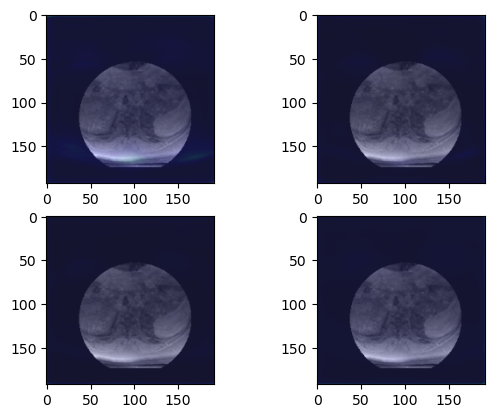

<Figure size 640x480 with 0 Axes>

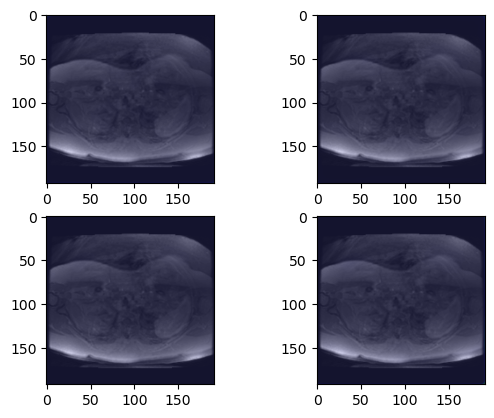

<Figure size 640x480 with 0 Axes>

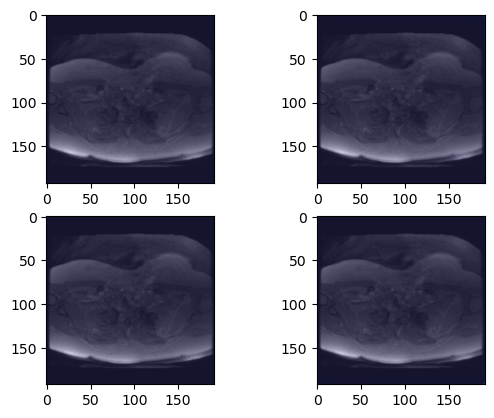

<Figure size 640x480 with 0 Axes>

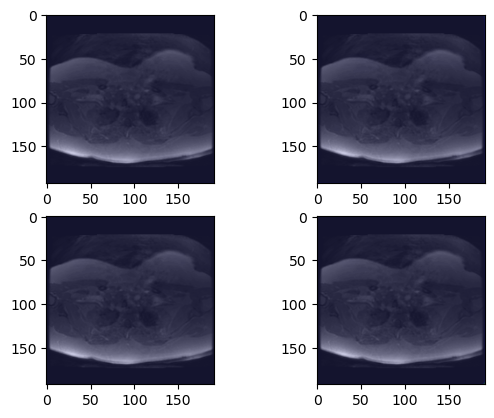

<Figure size 640x480 with 0 Axes>

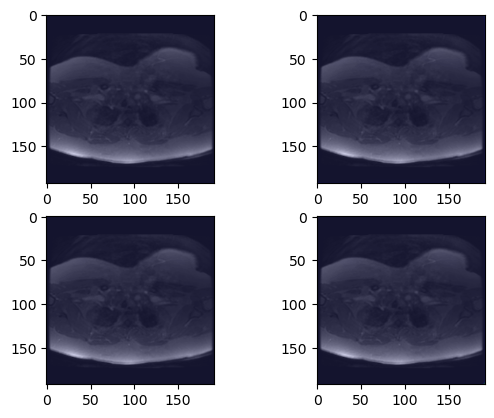

<Figure size 640x480 with 0 Axes>

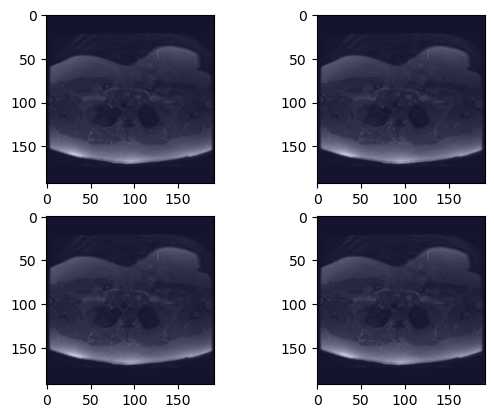

<Figure size 640x480 with 0 Axes>

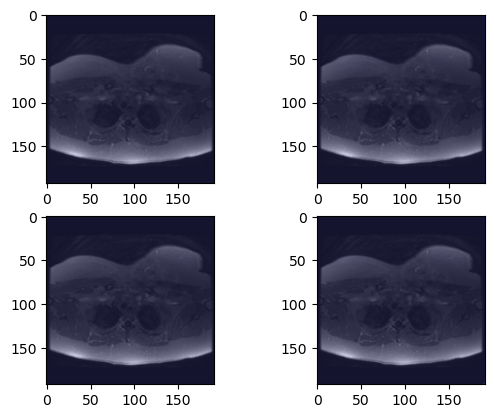

<Figure size 640x480 with 0 Axes>

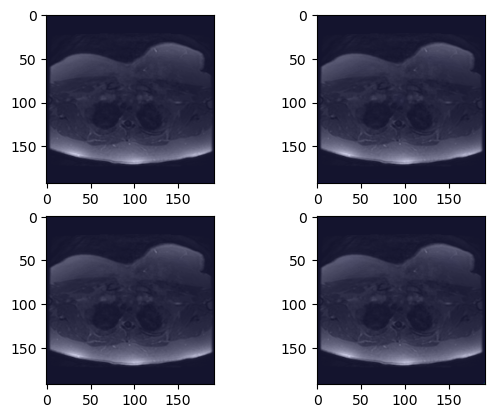

<Figure size 640x480 with 0 Axes>

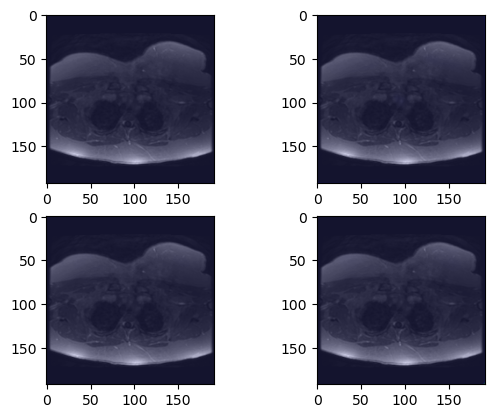

<Figure size 640x480 with 0 Axes>

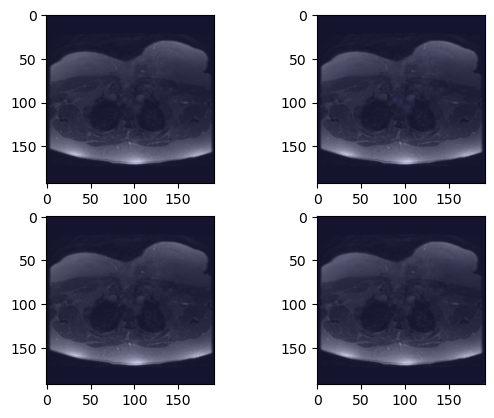

<Figure size 640x480 with 0 Axes>

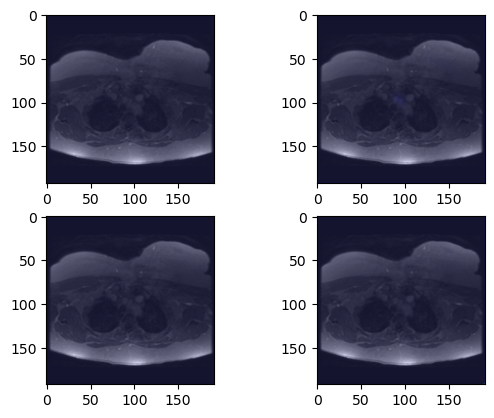

<Figure size 640x480 with 0 Axes>

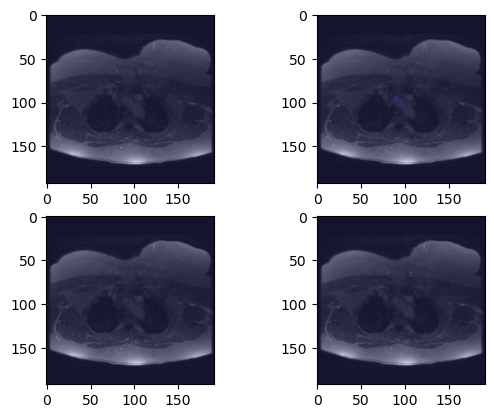

<Figure size 640x480 with 0 Axes>

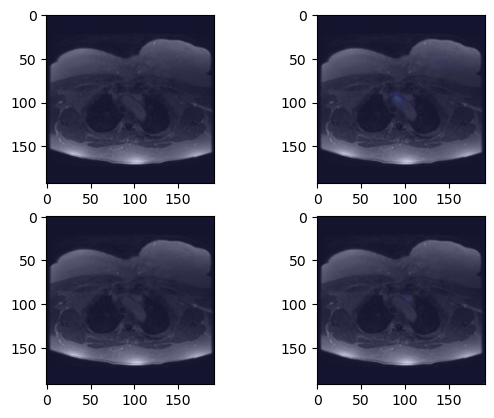

<Figure size 640x480 with 0 Axes>

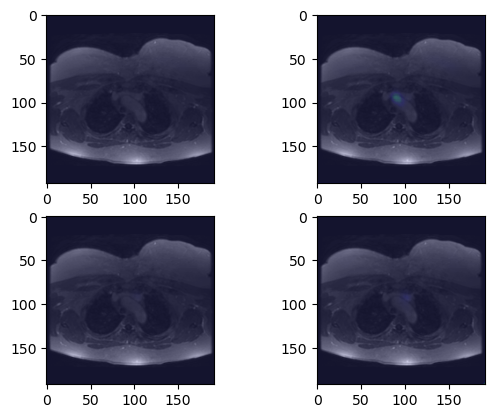

<Figure size 640x480 with 0 Axes>

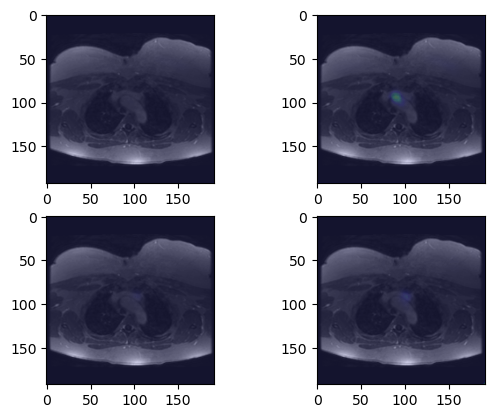

<Figure size 640x480 with 0 Axes>

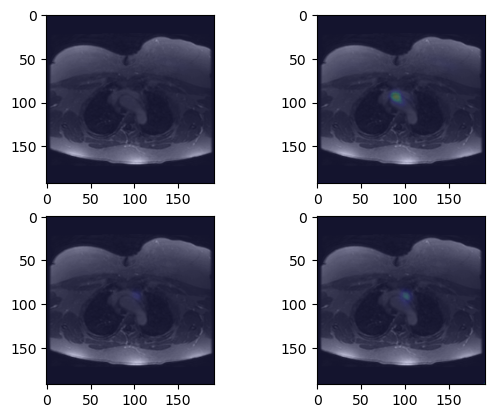

<Figure size 640x480 with 0 Axes>

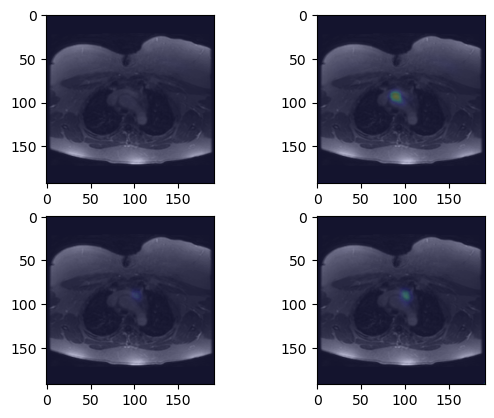

<Figure size 640x480 with 0 Axes>

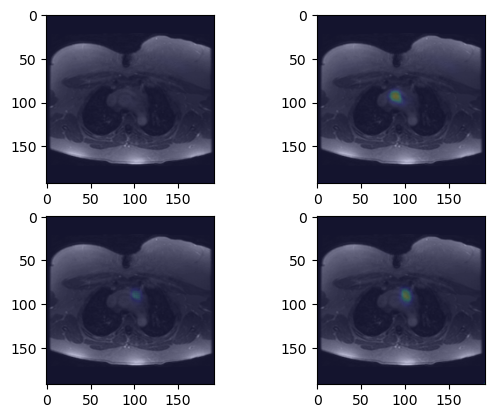

<Figure size 640x480 with 0 Axes>

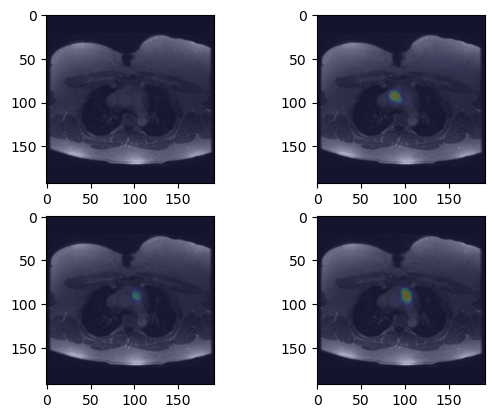

<Figure size 640x480 with 0 Axes>

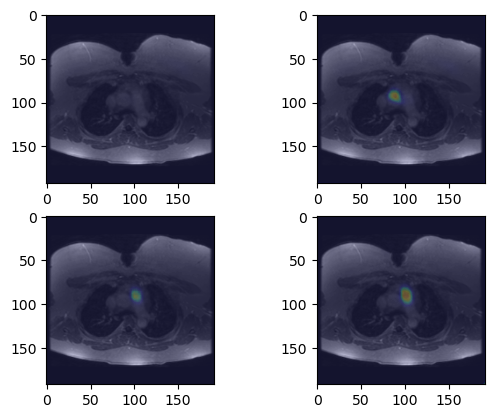

<Figure size 640x480 with 0 Axes>

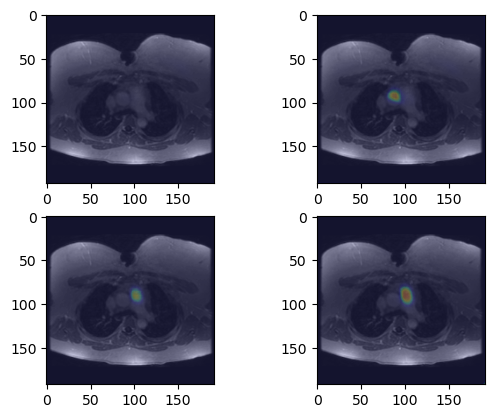

<Figure size 640x480 with 0 Axes>

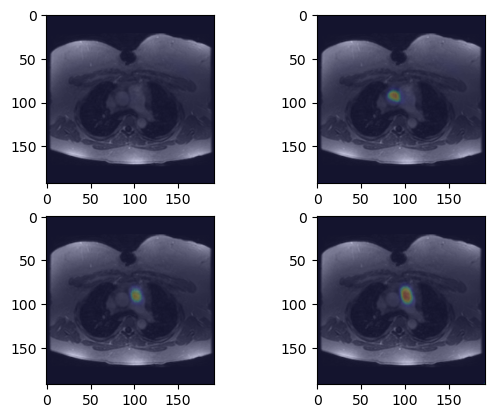

<Figure size 640x480 with 0 Axes>

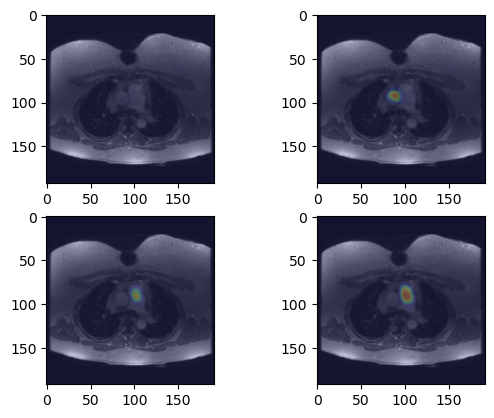

<Figure size 640x480 with 0 Axes>

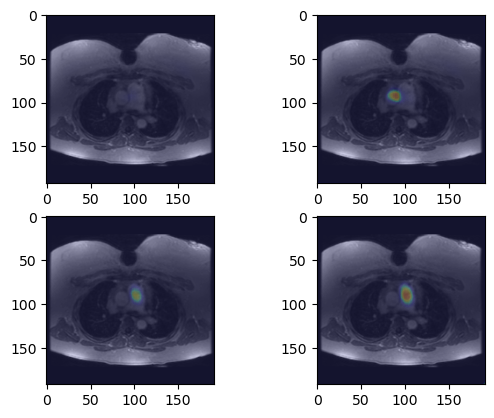

<Figure size 640x480 with 0 Axes>

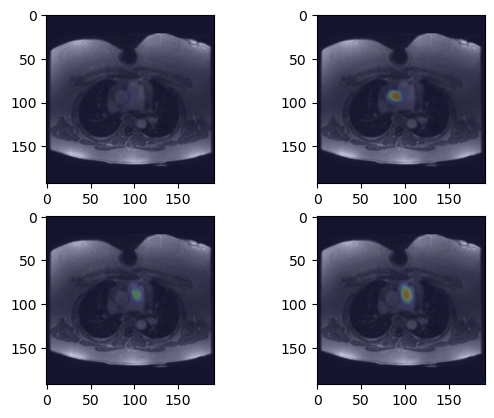

<Figure size 640x480 with 0 Axes>

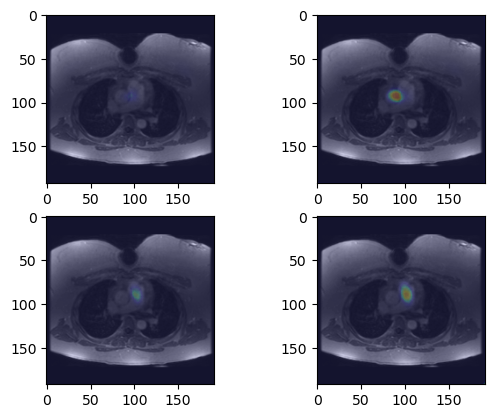

<Figure size 640x480 with 0 Axes>

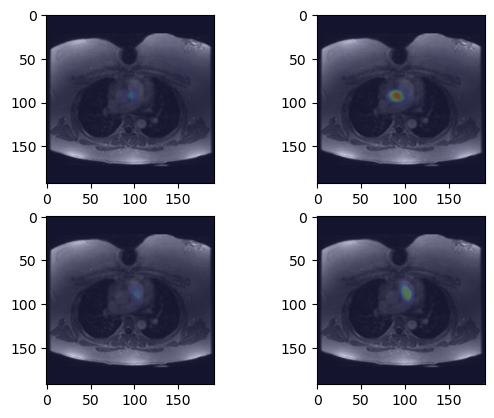

<Figure size 640x480 with 0 Axes>

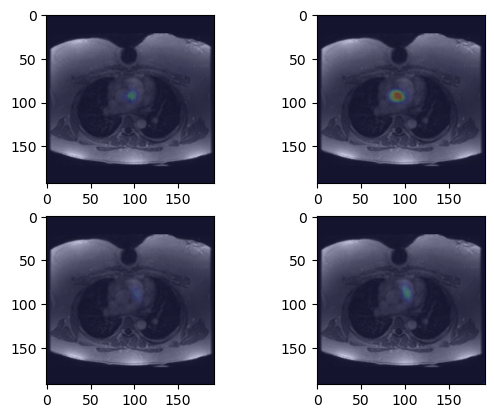

<Figure size 640x480 with 0 Axes>

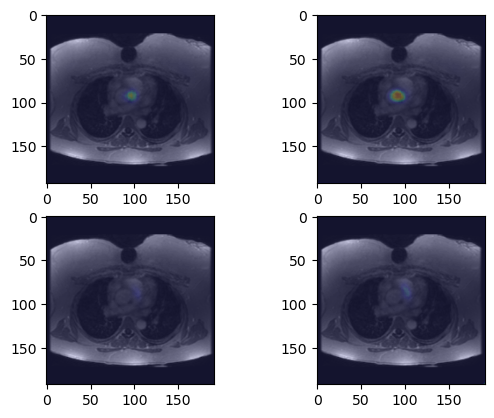

<Figure size 640x480 with 0 Axes>

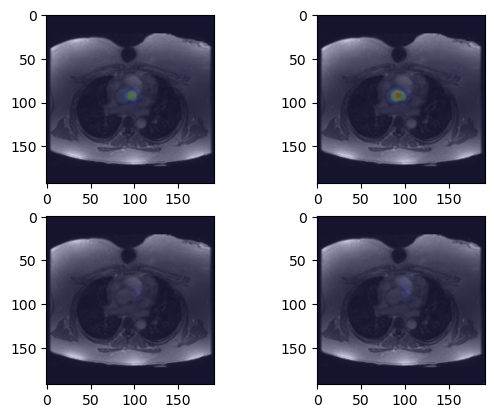

<Figure size 640x480 with 0 Axes>

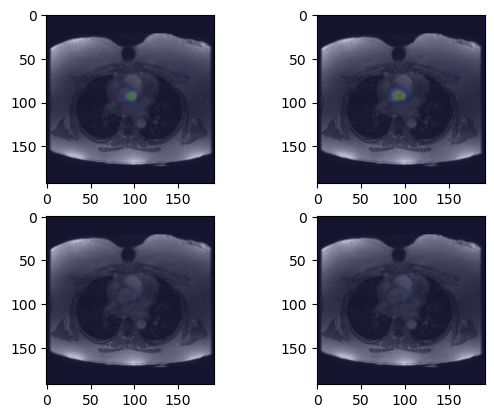

<Figure size 640x480 with 0 Axes>

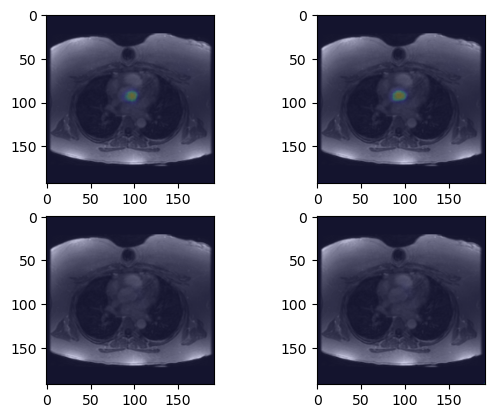

<Figure size 640x480 with 0 Axes>

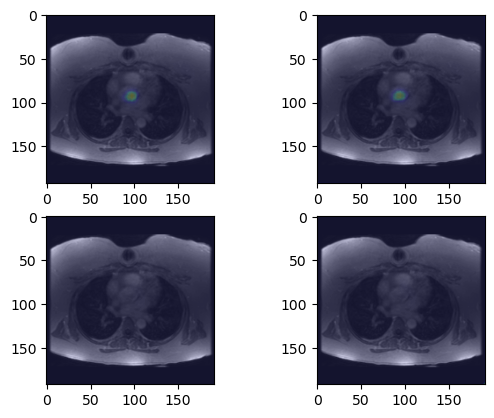

<Figure size 640x480 with 0 Axes>

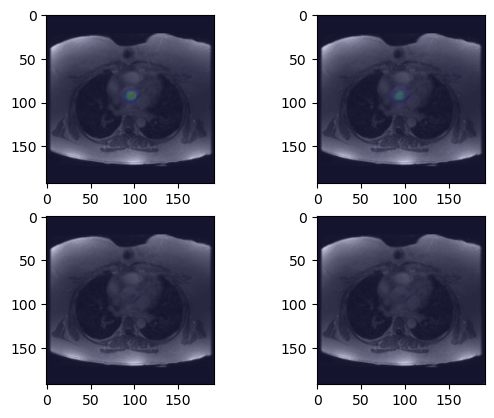

<Figure size 640x480 with 0 Axes>

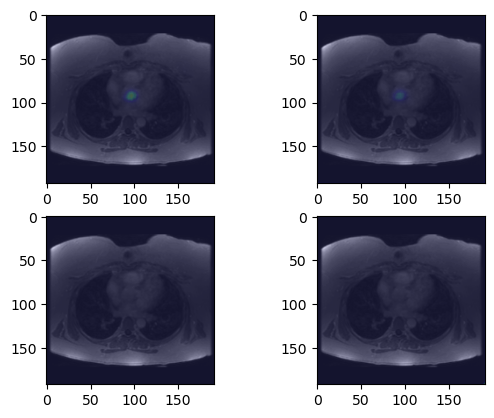

<Figure size 640x480 with 0 Axes>

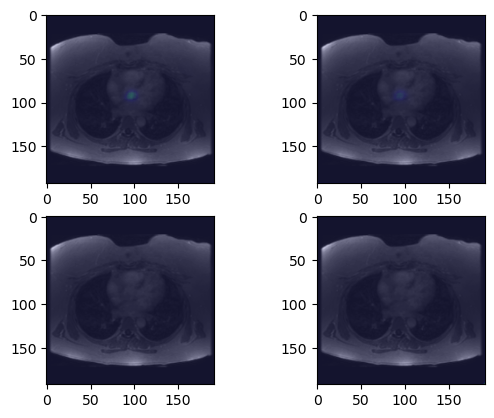

<Figure size 640x480 with 0 Axes>

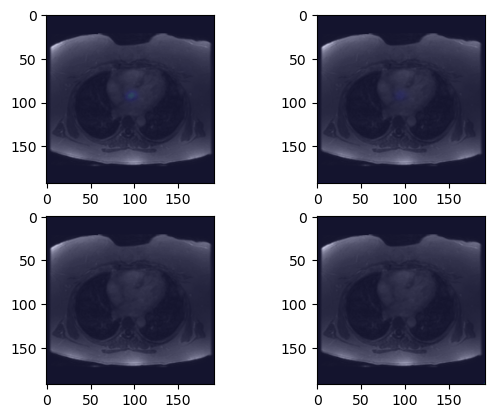

<Figure size 640x480 with 0 Axes>

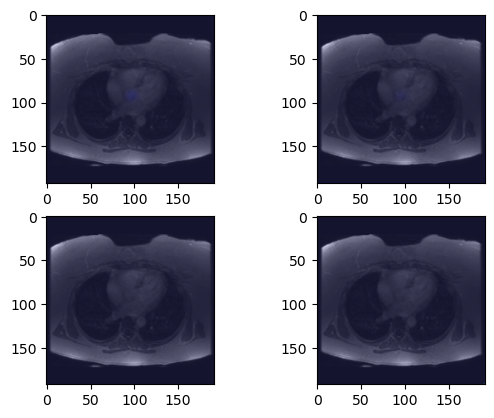

<Figure size 640x480 with 0 Axes>

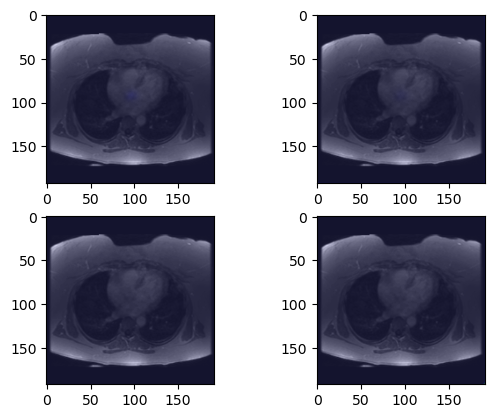

<Figure size 640x480 with 0 Axes>

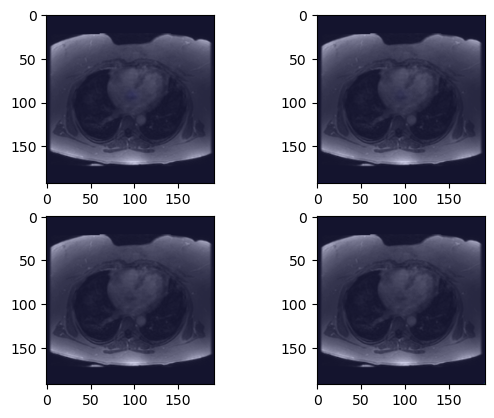

<Figure size 640x480 with 0 Axes>

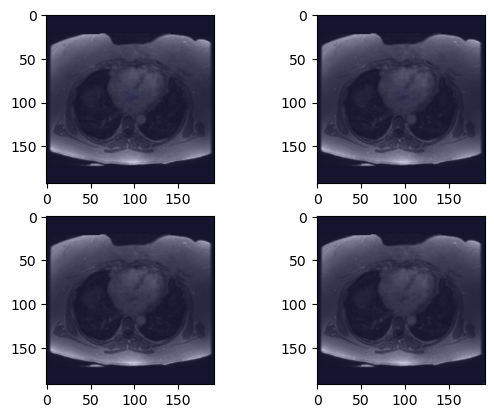

<Figure size 640x480 with 0 Axes>

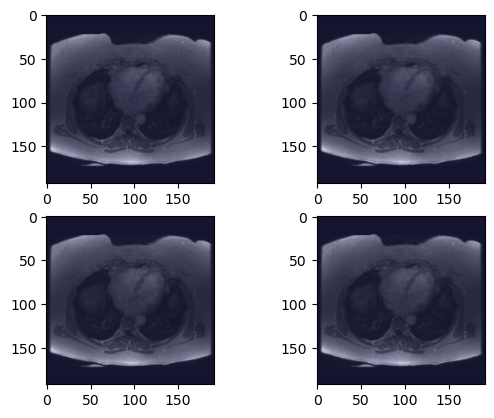

<Figure size 640x480 with 0 Axes>

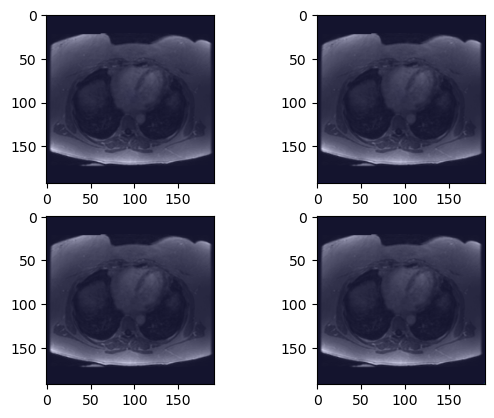

<Figure size 640x480 with 0 Axes>

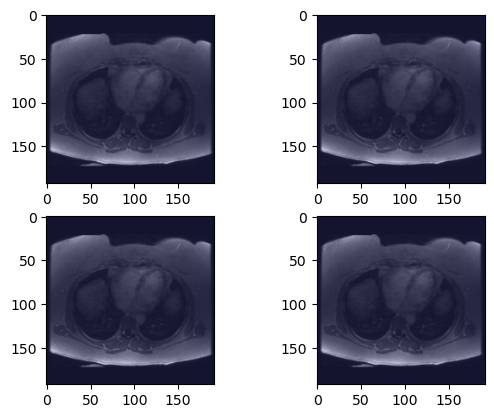

<Figure size 640x480 with 0 Axes>

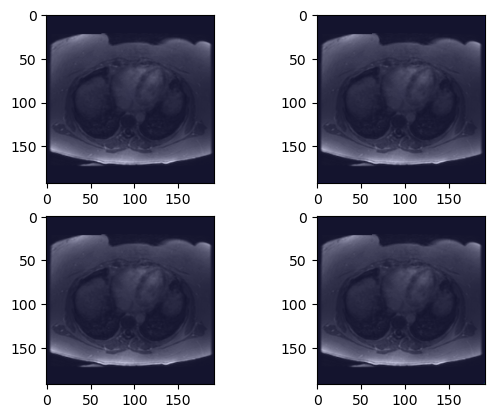

<Figure size 640x480 with 0 Axes>

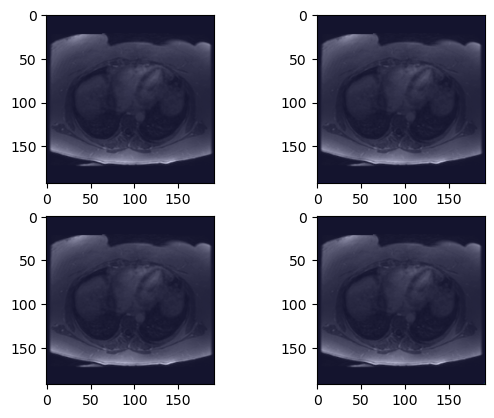

<Figure size 640x480 with 0 Axes>

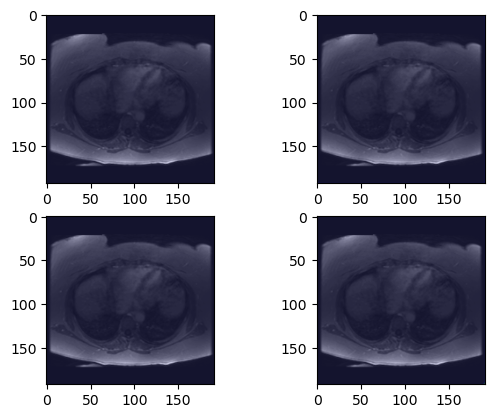

<Figure size 640x480 with 0 Axes>

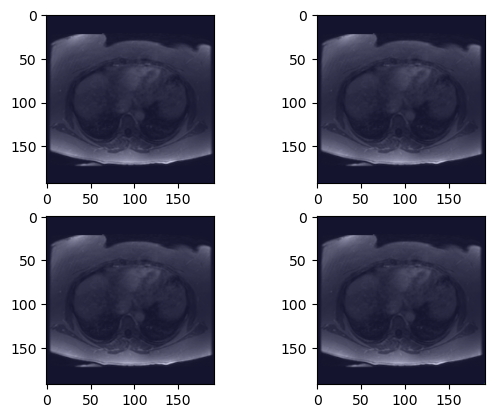

<Figure size 640x480 with 0 Axes>

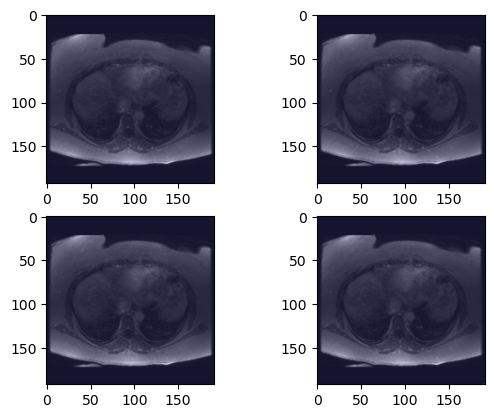

<Figure size 640x480 with 0 Axes>

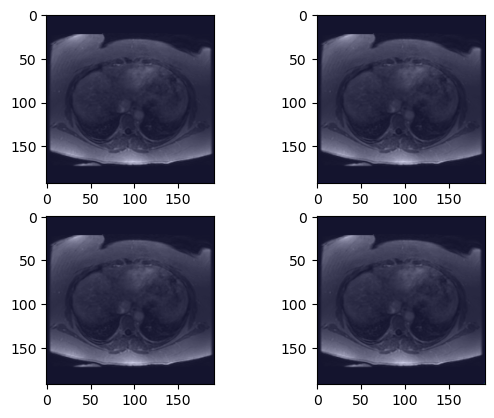

<Figure size 640x480 with 0 Axes>

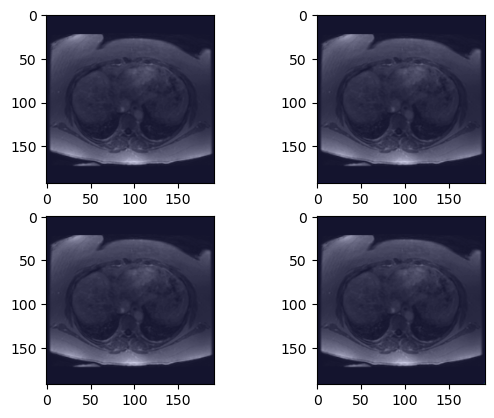

<Figure size 640x480 with 0 Axes>

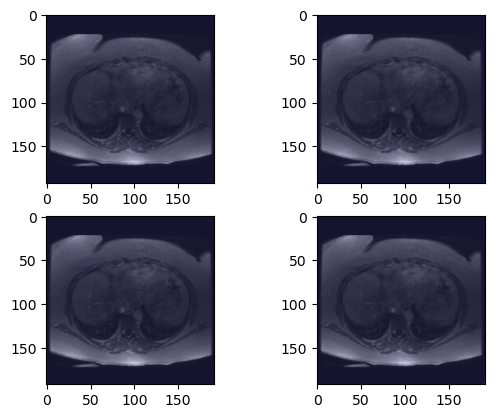

<Figure size 640x480 with 0 Axes>

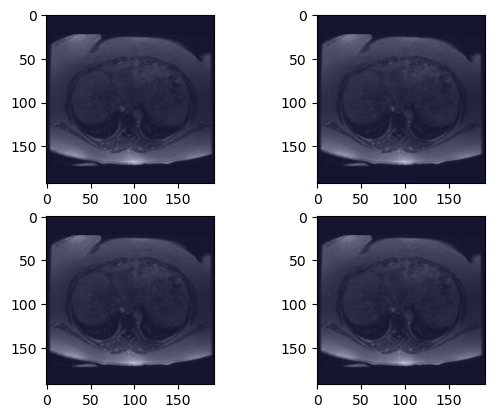

<Figure size 640x480 with 0 Axes>

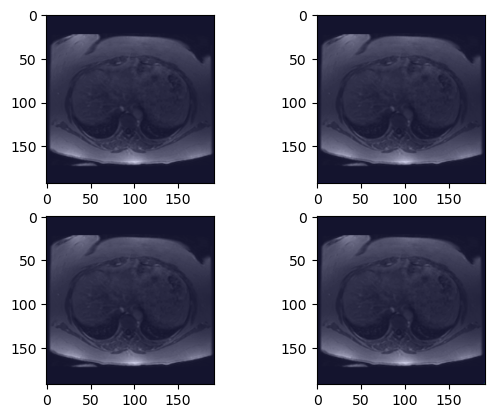

<Figure size 640x480 with 0 Axes>

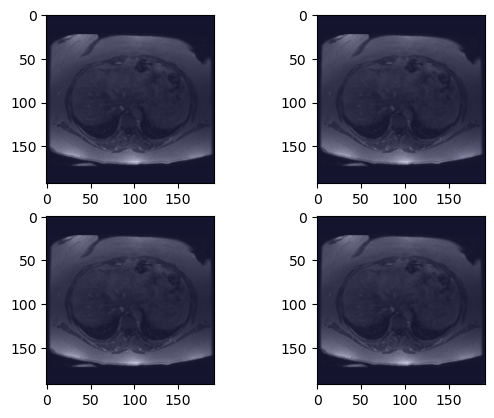

<Figure size 640x480 with 0 Axes>

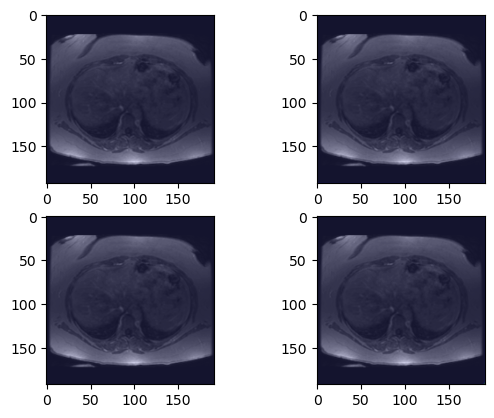

<Figure size 640x480 with 0 Axes>

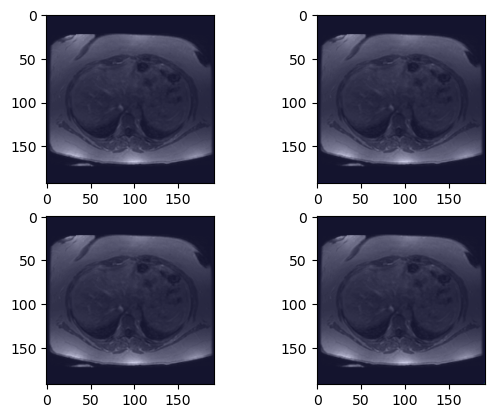

<Figure size 640x480 with 0 Axes>

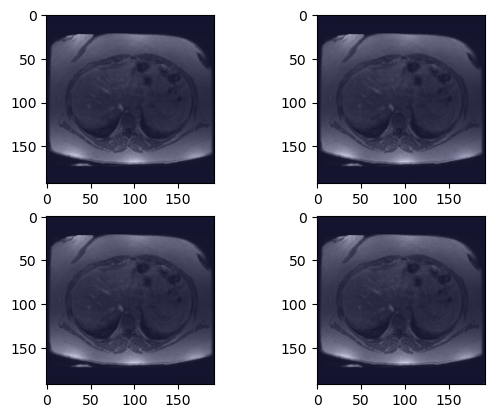

<Figure size 640x480 with 0 Axes>

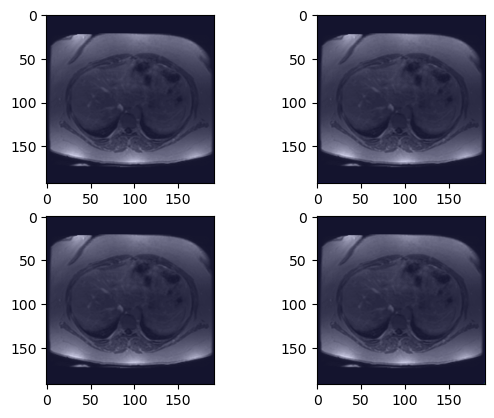

<Figure size 640x480 with 0 Axes>

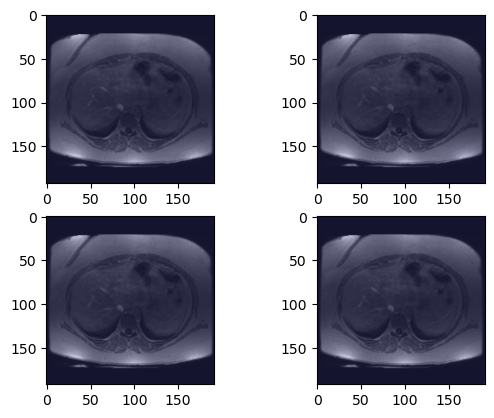

<Figure size 640x480 with 0 Axes>

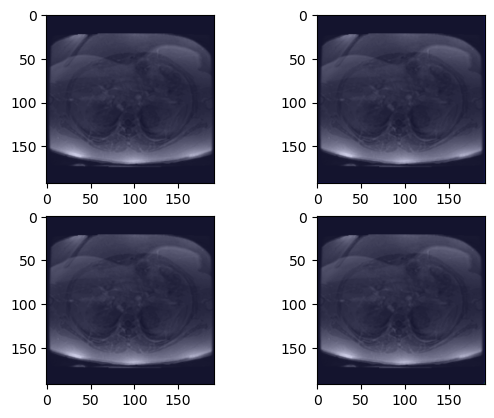

<Figure size 640x480 with 0 Axes>

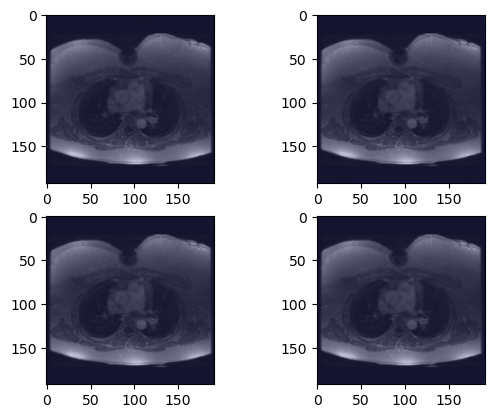

<Figure size 640x480 with 0 Axes>

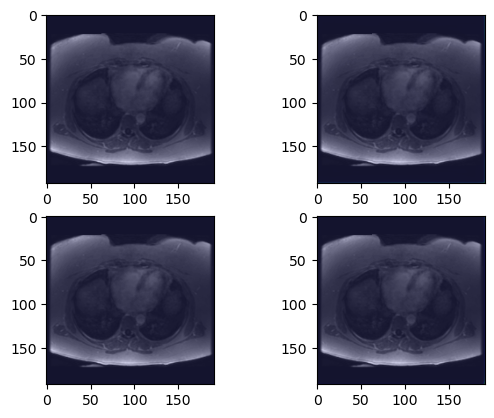

<Figure size 640x480 with 0 Axes>

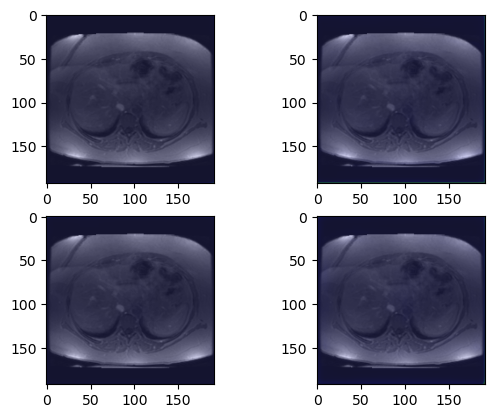

In [107]:
%matplotlib inline
predictions = [0,2,5,6]
lch = 1
pch = predictions[lch]
for z in range(0,64,1):
    plt.figure()
    fix, ax = plt.subplots(2,2)
    ax[0, 0].imshow(img[0,...,z,0], cmap='gray',alpha=0.9)
    ax[0,0].imshow(prd[0,...,z,predictions[0]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
    
    ax[0,1].imshow(img[0,...,z,0], cmap='gray',alpha=0.9)
    ax[0,1].imshow(prd[0,...,z,predictions[1]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
    
    ax[1,0].imshow(img[0,...,z,0], cmap='gray',alpha=0.9)
    ax[1,0].imshow(prd[0,...,z,predictions[2]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
    
    ax[1,1].imshow(img[0,...,z,0], cmap='gray',alpha=0.9)
    ax[1,1].imshow(prd[0,...,z,predictions[3]], cmap='jet', alpha=0.2, vmin=0, vmax=1)

    
#     ax[1].imshow(img[0,...,z,0], cmap='gray',alpha=0.9)
#     ax[1].imshow(lbl[0,...,z,lch], cmap='jet', alpha=0.2, vmin=0, vmax=1)


In [114]:
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio
from io import BytesIO

def create_scrolling_gif(
    test_img,
    test_prd,
    predictions=[0, 2, 5, 6],
    out_folder='.',
    fps=5
):
    """
    For each patient in test_prd.keys(), creates a scrolling GIF
    through the image stack, overlaying the specified prediction
    channels.
    
    This does NOT require FFmpeg, so no extra system dependencies
    are needed besides imageio and Pillow.

    Parameters
    ----------
    test_img : dict
        Dictionary keyed by patient ID, with multi-dimensional arrays.
    test_prd : dict
        Dictionary keyed by patient ID, with the prediction arrays.
    predictions : list of int
        Indices for the prediction channels you want to display.
    out_folder : str
        Path to the folder where the output GIF files will be saved.
    fps : int
        Frames per second for the GIF (converted internally to duration per frame).
    """

    # Make sure the output directory exists
    os.makedirs(out_folder, exist_ok=True)

    # Loop over each patient in the test_prd dictionary
    for pid in test_prd.keys():
        # Extract the image (adjust these slices to match your data shape)
        img = np.array(test_img[pid][3:4, ..., 0:1])  # shape: (1, H, W, D, 1)
        img = np.flip(img, axis=3)                   # Flip depth if needed

        # Extract predictions
        prd = np.array(test_prd[pid][0:1, ...])      # shape: (1, H, W, D, Channels)

        depth = img.shape[3]  # z-axis size
        frames = []

        for z in range(depth):
            fig, ax = plt.subplots(2, 2, figsize=(6, 6))

            # Top-left
            ax[0, 0].imshow(img[0, ..., z, 0], cmap='gray', alpha=0.9)
            ax[0, 0].imshow(prd[0, ..., z, predictions[0]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
            ax[0, 0].set_title(f'Channel {predictions[0]}')

            # Top-right
            ax[0, 1].imshow(img[0, ..., z, 0], cmap='gray', alpha=0.9)
            ax[0, 1].imshow(prd[0, ..., z, predictions[1]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
            ax[0, 1].set_title(f'Channel {predictions[1]}')

            # Bottom-left
            ax[1, 0].imshow(img[0, ..., z, 0], cmap='gray', alpha=0.9)
            ax[1, 0].imshow(prd[0, ..., z, predictions[2]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
            ax[1, 0].set_title(f'Channel {predictions[2]}')

            # Bottom-right
            ax[1, 1].imshow(img[0, ..., z, 0], cmap='gray', alpha=0.9)
            ax[1, 1].imshow(prd[0, ..., z, predictions[3]], cmap='jet', alpha=0.2, vmin=0, vmax=1)
            ax[1, 1].set_title(f'Channel {predictions[3]}')

            # Turn off axis ticks
            for row in ax:
                for a in row:
                    a.axis('off')

            plt.tight_layout()

            # Save this figure to a buffer
            buf = BytesIO()
            plt.savefig(buf, format='png', dpi=80)
            buf.seek(0)
            plt.close(fig)

            # Convert buffer to a NumPy image
            frame = imageio.imread(buf)
            frames.append(frame)

        # Define output filename
        gif_path = os.path.join(out_folder, f"{pid}_scroll.gif")

        # Calculate duration per frame in milliseconds
        # 1 second / fps => 1000ms / fps
        frame_duration_ms = int(1000 / fps)

        # Save frames as a GIF
        # 'duration' sets the time per frame in milliseconds. 
        imageio.mimsave(gif_path, frames, duration=frame_duration_ms / 1000)

        print(f"Saved scrolling GIF for patient {pid} to: {gif_path}")


In [115]:
create_scrolling_gif(
    test_img=test_img,
    test_prd=test_prd,
    predictions=[0, 2, 5, 6],
    out_folder='localization_videos',
    fps=5  # e.g. 5 frames per second
)


Saved scrolling GIF for patient Bibipnox to: localization_videos/Bibipnox_scroll.gif
Saved scrolling GIF for patient Cakimtol to: localization_videos/Cakimtol_scroll.gif
Saved scrolling GIF for patient Dicibi to: localization_videos/Dicibi_scroll.gif
Saved scrolling GIF for patient Finkebet to: localization_videos/Finkebet_scroll.gif
Saved scrolling GIF for patient Flopika to: localization_videos/Flopika_scroll.gif
Saved scrolling GIF for patient Gifice to: localization_videos/Gifice_scroll.gif
Saved scrolling GIF for patient Hopitat to: localization_videos/Hopitat_scroll.gif
Saved scrolling GIF for patient Jugesag to: localization_videos/Jugesag_scroll.gif
Saved scrolling GIF for patient Nesescet to: localization_videos/Nesescet_scroll.gif
Saved scrolling GIF for patient Nosaybos to: localization_videos/Nosaybos_scroll.gif
Saved scrolling GIF for patient Nuebafru to: localization_videos/Nuebafru_scroll.gif
Saved scrolling GIF for patient Petafi to: localization_videos/Petafi_scroll.gi